In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Data Import & Cleansing

In [207]:
import glob

path = r'Downloads/Events' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

df_all = pd.DataFrame()
df_all = pd.concat(li, axis=0, ignore_index=True)

In [208]:
df_all.capture_time.unique().tolist()

['08/05/2021 12:37:16',
 '06/05/2021 13:06:54',
 '04/05/2021 13:37:06',
 '03/05/2021 13:41:22',
 '05/05/2021 13:18:18',
 '07/05/2021 12:47:22',
 '02/05/2021 14:10:42']

In [209]:
df_all.head(3)

,Unnamed: 0,capture_time,event_link,room_name,club_name,event_date,event_time,room_desc
0,0,08/05/2021 12:37:16,https://www.joinclubhouse.com/event/MdQVJj4o,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),COMMUNITY CLUB 🏠,08-05-2021,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve..."
1,1,08/05/2021 12:37:16,https://www.joinclubhouse.com/event/PAjrKO6O,Weekend practice 🤯😊🇩🇪🥰,PRACTICE GERMAN...SLOWLY 🏠,08-05-2021,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F..."
2,2,08/05/2021 12:37:16,https://www.joinclubhouse.com/event/PAaRaKk1,Side Hustle Saturday - How To Make An Extra $1k,GARY 🏠,08-05-2021,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday..."


In [210]:
df_unique = pd.DataFrame()
df_unique = df_all[['room_name','club_name','event_date','event_time','room_desc']]
df_unique = df_unique.drop_duplicates()
df_unique

,room_name,club_name,event_date,event_time,room_desc
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),COMMUNITY CLUB 🏠,08-05-2021,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve..."
1,Weekend practice 🤯😊🇩🇪🥰,PRACTICE GERMAN...SLOWLY 🏠,08-05-2021,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F..."
2,Side Hustle Saturday - How To Make An Extra $1k,GARY 🏠,08-05-2021,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday..."
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,VIP 🏠,08-05-2021,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah..."
4,🎙📚5min BizBook share/react 🌎🌏🌍,MBA 🏠,08-05-2021,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D..."
...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,CLUBPOD 🏠,04-05-2021,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,..."
1399,Talent Show,TOO MANY MODS CLUB 🏠,04-05-2021,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub..."
1401,🧠 WIN the Inner Game of Money 💰,THE “INNER GAME” CLUB 🏠,04-05-2021,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B..."
1408,How I Do It: Building,TECH BUILDERS 🏠,04-05-2021,00:00,"w/ Soumeya Benghanem, Justin Rogers"


In [211]:
df_clean = df_unique[['room_name','event_date','event_time','room_desc']].dropna()
df_clean = df_clean.join(df_unique[['club_name']])
df_clean

,room_name,event_date,event_time,room_desc,club_name
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),08-05-2021,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠
1,Weekend practice 🤯😊🇩🇪🥰,08-05-2021,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠
2,Side Hustle Saturday - How To Make An Extra $1k,08-05-2021,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,08-05-2021,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠
4,🎙📚5min BizBook share/react 🌎🌏🌍,08-05-2021,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠
...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,04-05-2021,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠
1399,Talent Show,04-05-2021,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠
1401,🧠 WIN the Inner Game of Money 💰,04-05-2021,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠
1408,How I Do It: Building,04-05-2021,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠


In [212]:
df_clean['event_date'] = pd.to_datetime(df_clean['event_date'], format="%d-%m-%Y")
df_clean['event_ts'] = pd.to_datetime(df_clean['event_date'].apply(str)+' '+df_clean['event_time']+':00')
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00
...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00


In [213]:
import datetime
df_clean['event_ts_trunc'] = df_clean['event_ts'].dt.round('60min')

df_clean['event_time_trunc'] = df_clean.event_ts_trunc.dt.time
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00
...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00


In [214]:
df_clean[df_clean["room_desc"].str.count(" - ") > 1].room_desc.to_list()

['w/ Martina Lofqvist, Alder Riley, Darren Charrier — A weekly - 30 minute - talk about the hottest space news from the past week. Join the conversation to whatever snack you might be crunching!',
 'w/ Jenny Kassan, Africa Archield, Rachael Lashbrook — Learn the 6 steps to design your customized fundraising strategy - this week we will focus on Step 6 - preparing to address mindset obstacles',
 "w/ stephanie saffa simon, Paul Davison — We've had a blast - and more than a few late nights - reviewing the 5,000 incredible submissions for new Clubhouse format and shows — and now it's time to announce the concepts that will be moving forward! See you Wednesday morning at 9am PST 😇",
 'w/ Eugene Rishon — DesignFastForward© - The Gamified Product Design Challenge - goes Clubhouse. Join to learn what the buzz is about and why designers should be ecstatic about it. 30min / No recording',
 'w/ Miss SuperNerd, Shavonne Taylor, Skrapp — Weekday mindfulness sessions of: - Inspirational Wisdom - Bre

In [215]:
def get_speakers (row):
    if " — " in row['room_desc']:
        return row["room_desc"].partition(' — ')[0].replace("w/ ","").replace(row["room_desc"].partition(" — ")[2],"").replace(" — ","")
    else:
        return row["room_desc"].replace("w/ ","")

def get_room_desc (row):
    if " — " in row['room_desc']:
        return row["room_desc"].partition(" — ")[2]
    else:
        return np.nan

In [216]:
df_clean['speakers'] = df_clean.apply (lambda row: get_speakers(row), axis=1)
df_clean["room_desc2"] = df_clean.apply (lambda row: get_room_desc(row), axis=1)
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00,"Taimak Glowz, Ju Beck, Annemarie Schmidt, Farn...",NaN
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"Gary Henderson, Peyton Henderson",Saturday’s are for the side hustle.
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi, ...",✅ اتاق تحلیل کریپتوکارنسی از صفر تا صد📈💵
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00,"Kal Patel, Lali Dangazele, Matt Sakumoto, Domi...",NaN
...,...,...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Caroline Geraghty, Hala Taha, Steve Olsher, Ka...","Join Hala, celebrity podcasters & top influenc..."
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Victoria Elena Nones, God, Rachel Weintraub, G...",Come to the talent show where talented people ...
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"John Assaraf, Julie Reisler, LISA♡ RUEFF, Bria...",🧠 Are you ready to achieve financial success f...
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Soumeya Benghanem, Justin Rogers",NaN


In [217]:
df_clean["speakers"][0]

'Semhar Negassa, Zipporah Kuria, Aidan Cleverly, Abraxas Higgins, Jaleesa Jaikaran, Dr.Maryam Alkubati'

In [218]:
df_clean['speaker_list'] = df_clean["speakers"].str.split(', ')
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2,speaker_list
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,"[Semhar Negassa, Zipporah Kuria, Aidan Cleverl..."
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00,"Taimak Glowz, Ju Beck, Annemarie Schmidt, Farn...",NaN,"[Taimak Glowz, Ju Beck, Annemarie Schmidt, Far..."
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"Gary Henderson, Peyton Henderson",Saturday’s are for the side hustle.,"[Gary Henderson, Peyton Henderson]"
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi, ...",✅ اتاق تحلیل کریپتوکارنسی از صفر تا صد📈💵,"[faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi,..."
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00,"Kal Patel, Lali Dangazele, Matt Sakumoto, Domi...",NaN,"[Kal Patel, Lali Dangazele, Matt Sakumoto, Dom..."
...,...,...,...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Caroline Geraghty, Hala Taha, Steve Olsher, Ka...","Join Hala, celebrity podcasters & top influenc...","[Caroline Geraghty, Hala Taha, Steve Olsher, K..."
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Victoria Elena Nones, God, Rachel Weintraub, G...",Come to the talent show where talented people ...,"[Victoria Elena Nones, God, Rachel Weintraub, ..."
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"John Assaraf, Julie Reisler, LISA♡ RUEFF, Bria...",🧠 Are you ready to achieve financial success f...,"[John Assaraf, Julie Reisler, LISA♡ RUEFF, Bri..."
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Soumeya Benghanem, Justin Rogers",NaN,"[Soumeya Benghanem, Justin Rogers]"


In [219]:
df_clean['event_ts_trunc_pst'] = df_clean.event_ts_trunc.dt.tz_localize("GMT").dt.tz_convert('America/Los_Angeles')
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2,speaker_list,event_ts_trunc_pst
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,"[Semhar Negassa, Zipporah Kuria, Aidan Cleverl...",2021-05-08 04:00:00-07:00
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00,"Taimak Glowz, Ju Beck, Annemarie Schmidt, Farn...",NaN,"[Taimak Glowz, Ju Beck, Annemarie Schmidt, Far...",2021-05-08 04:00:00-07:00
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"Gary Henderson, Peyton Henderson",Saturday’s are for the side hustle.,"[Gary Henderson, Peyton Henderson]",2021-05-08 05:00:00-07:00
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi, ...",✅ اتاق تحلیل کریپتوکارنسی از صفر تا صد📈💵,"[faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi,...",2021-05-08 05:00:00-07:00
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00,"Kal Patel, Lali Dangazele, Matt Sakumoto, Domi...",NaN,"[Kal Patel, Lali Dangazele, Matt Sakumoto, Dom...",2021-05-08 05:00:00-07:00
...,...,...,...,...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Caroline Geraghty, Hala Taha, Steve Olsher, Ka...","Join Hala, celebrity podcasters & top influenc...","[Caroline Geraghty, Hala Taha, Steve Olsher, K...",2021-05-03 17:00:00-07:00
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Victoria Elena Nones, God, Rachel Weintraub, G...",Come to the talent show where talented people ...,"[Victoria Elena Nones, God, Rachel Weintraub, ...",2021-05-03 17:00:00-07:00
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"John Assaraf, Julie Reisler, LISA♡ RUEFF, Bria...",🧠 Are you ready to achieve financial success f...,"[John Assaraf, Julie Reisler, LISA♡ RUEFF, Bri...",2021-05-03 17:00:00-07:00
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Soumeya Benghanem, Justin Rogers",NaN,"[Soumeya Benghanem, Justin Rogers]",2021-05-03 17:00:00-07:00


In [220]:
df_clean['event_time_trunc_pst'] = df_clean.event_ts_trunc_pst.dt.time
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2,speaker_list,event_ts_trunc_pst,event_time_trunc_pst
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,"[Semhar Negassa, Zipporah Kuria, Aidan Cleverl...",2021-05-08 04:00:00-07:00,04:00:00
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00,"Taimak Glowz, Ju Beck, Annemarie Schmidt, Farn...",NaN,"[Taimak Glowz, Ju Beck, Annemarie Schmidt, Far...",2021-05-08 04:00:00-07:00,04:00:00
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"Gary Henderson, Peyton Henderson",Saturday’s are for the side hustle.,"[Gary Henderson, Peyton Henderson]",2021-05-08 05:00:00-07:00,05:00:00
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi, ...",✅ اتاق تحلیل کریپتوکارنسی از صفر تا صد📈💵,"[faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi,...",2021-05-08 05:00:00-07:00,05:00:00
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00,"Kal Patel, Lali Dangazele, Matt Sakumoto, Domi...",NaN,"[Kal Patel, Lali Dangazele, Matt Sakumoto, Dom...",2021-05-08 05:00:00-07:00,05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Caroline Geraghty, Hala Taha, Steve Olsher, Ka...","Join Hala, celebrity podcasters & top influenc...","[Caroline Geraghty, Hala Taha, Steve Olsher, K...",2021-05-03 17:00:00-07:00,17:00:00
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Victoria Elena Nones, God, Rachel Weintraub, G...",Come to the talent show where talented people ...,"[Victoria Elena Nones, God, Rachel Weintraub, ...",2021-05-03 17:00:00-07:00,17:00:00
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"John Assaraf, Julie Reisler, LISA♡ RUEFF, Bria...",🧠 Are you ready to achieve financial success f...,"[John Assaraf, Julie Reisler, LISA♡ RUEFF, Bri...",2021-05-03 17:00:00-07:00,17:00:00
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Soumeya Benghanem, Justin Rogers",NaN,"[Soumeya Benghanem, Justin Rogers]",2021-05-03 17:00:00-07:00,17:00:00


# Event Time Trend

In [221]:
df_room_by_time = pd.DataFrame(df_clean.groupby(['event_time_trunc','event_time_trunc_pst'], as_index=False)["room_name"].count()).sort_values(by=['event_time_trunc'])
df_room_by_time["event_time_trunc"] = df_room_by_time["event_time_trunc"].astype(str)
df_room_by_time["event_time_trunc_pst"] = df_room_by_time["event_time_trunc_pst"].astype(str)
df_room_by_time

,event_time_trunc,event_time_trunc_pst,room_name
0,00:00:00,17:00:00,99
1,01:00:00,18:00:00,47
2,02:00:00,19:00:00,31
3,03:00:00,20:00:00,11
4,04:00:00,21:00:00,12
5,05:00:00,22:00:00,4
6,06:00:00,23:00:00,2
7,07:00:00,00:00:00,1
8,08:00:00,01:00:00,7
9,09:00:00,02:00:00,6


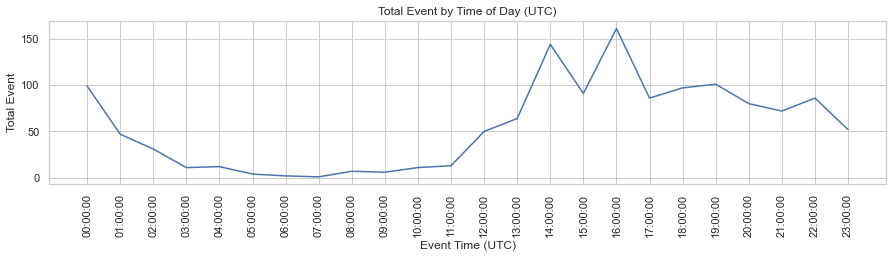

In [222]:
f, ax = plt.subplots(figsize=(15, 3))

ax = sns.lineplot(x="event_time_trunc", y="room_name",
#              hue="region", style="event",
             data=df_room_by_time)

plt.xticks(rotation=90)
plt.title("Total Event by Time of Day (UTC)")
plt.xlabel("Event Time (UTC)")
plt.ylabel("Total Event")
plt.show()

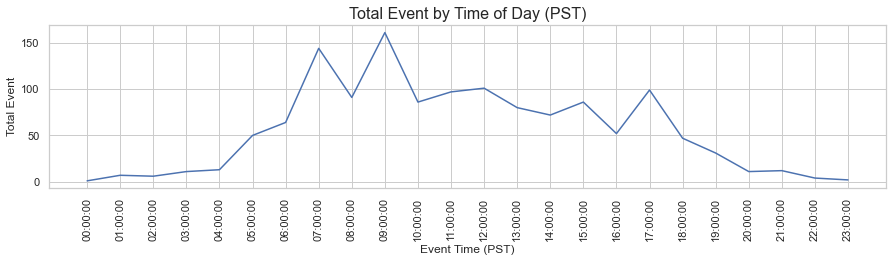

In [272]:
f, ax = plt.subplots(figsize=(15, 3))

ax = sns.lineplot(x="event_time_trunc_pst", y="room_name",
#              hue="region", style="event",
             data=df_room_by_time.sort_values(by=['event_time_trunc_pst']))

plt.xticks(rotation=90)
plt.title("Total Event by Time of Day (PST)", fontsize=16)
plt.xlabel("Event Time (PST)")
plt.ylabel("Total Event")
plt.show()

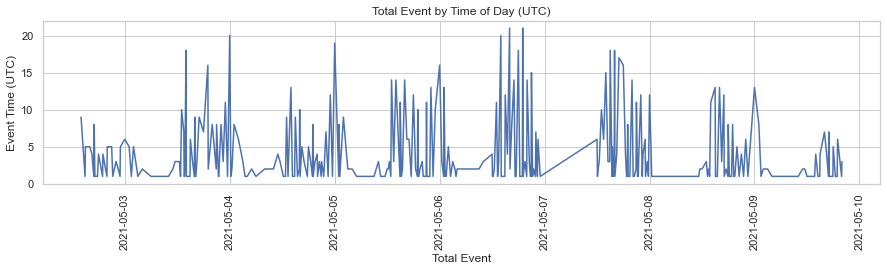

In [224]:
f, ax = plt.subplots(figsize=(15, 3))

ax = sns.lineplot(x="event_ts", y="room_name",
#              hue="region", style="event",
             data=pd.DataFrame(df_clean.groupby(['event_ts'], as_index=False)["room_name"].count()).sort_values(by=['event_ts']))

plt.xticks(rotation=90)
plt.title("Total Event by Time of Day (UTC)")
plt.ylabel("Event Time (UTC)")
plt.xlabel("Total Event")
plt.show()

In [270]:
df_clean['day_name'] = df_clean['event_ts_trunc_pst'].dt.day_name()

Text(0.5, 1.0, 'Heatmap of Clubhouse Events')

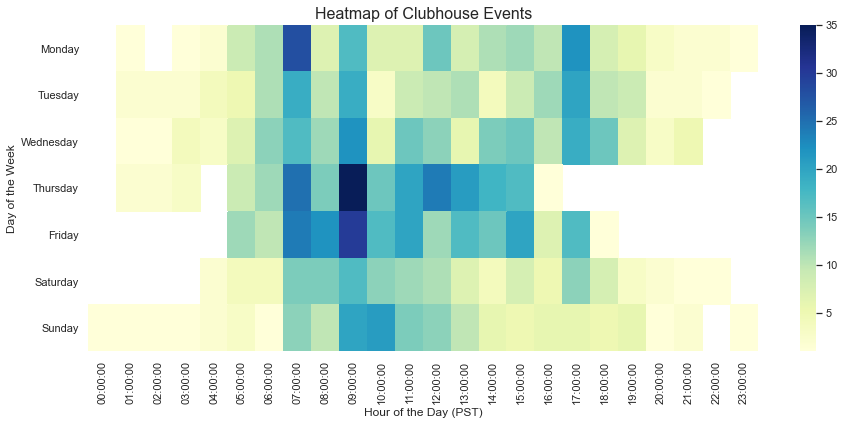

In [274]:
# day of week / hour trends
df_heatmap = df_clean.groupby(['event_time_trunc_pst','day_name']).room_name.nunique()
df_heatmap = df_heatmap.unstack(level=0)
df_heatmap

# heatmap by day of week and hour

f, ax = plt.subplots(figsize=(15, 6))
sns.set_color_codes("pastel")

reorderlist = [ 'Monday', 'Tuesday','Wednesday' ,'Thursday' ,'Friday', 'Saturday', 'Sunday']
sns.heatmap(df_heatmap.reindex(reorderlist), cmap="YlGnBu")

plt.xlabel('Hour of the Day (PST)')
plt.ylabel('Day of the Week')

plt.title('Heatmap of Clubhouse Events', fontsize=16)

# Active Clubs

In [227]:
df_room_by_club = pd.DataFrame(df_clean.groupby(['club_name'], as_index=False)["room_name"].count())

/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 127968 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 127968 missing from current font.
  font.set_text(s, 0, flags=flags)


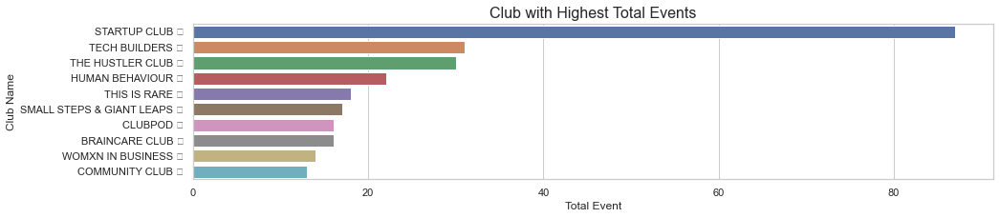

In [228]:
f, ax = plt.subplots(figsize=(15, 3))

sns.set_theme(style="whitegrid")
tips = sns.load_dataset("tips")

ax = sns.barplot(y="club_name", x="room_name", data=df_room_by_club.sort_values(by=['room_name'], ascending = False).head(10))

plt.title("Club with Highest Total Events", fontsize=16)
plt.xlabel("Total Event")
plt.ylabel("Club Name")
plt.show()

# Active Speakers

In [229]:
df_speaker = pd.DataFrame()
df_speaker = df_clean.explode('speaker_list')
df_speaker

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2,speaker_list,event_ts_trunc_pst,event_time_trunc_pst,day_name
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,Semhar Negassa,2021-05-08 04:00:00-07:00,04:00:00,Saturday
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,Zipporah Kuria,2021-05-08 04:00:00-07:00,04:00:00,Saturday
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,Aidan Cleverly,2021-05-08 04:00:00-07:00,04:00:00,Saturday
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,Abraxas Higgins,2021-05-08 04:00:00-07:00,04:00:00,Saturday
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,Jaleesa Jaikaran,2021-05-08 04:00:00-07:00,04:00:00,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1409,THE PRINCESS 👑 AND THE FROG 🐸 CH | Callbacks (🔴),2021-05-04,00:00,"w/ Benjamin Vigil, Davonté Burse, Talia Moore,...",OG CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Benjamin Vigil, Davonté Burse, Talia Moore, Ta...","For callbacks, hand raising is turned off. Ben...",Nathan Nonhof,2021-05-03 17:00:00-07:00,17:00:00,Tuesday
1409,THE PRINCESS 👑 AND THE FROG 🐸 CH | Callbacks (🔴),2021-05-04,00:00,"w/ Benjamin Vigil, Davonté Burse, Talia Moore,...",OG CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Benjamin Vigil, Davonté Burse, Talia Moore, Ta...","For callbacks, hand raising is turned off. Ben...",Tamieka Briscoe,2021-05-03 17:00:00-07:00,17:00:00,Tuesday
1409,THE PRINCESS 👑 AND THE FROG 🐸 CH | Callbacks (🔴),2021-05-04,00:00,"w/ Benjamin Vigil, Davonté Burse, Talia Moore,...",OG CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Benjamin Vigil, Davonté Burse, Talia Moore, Ta...","For callbacks, hand raising is turned off. Ben...",Richard Allen,2021-05-03 17:00:00-07:00,17:00:00,Tuesday
1409,THE PRINCESS 👑 AND THE FROG 🐸 CH | Callbacks (🔴),2021-05-04,00:00,"w/ Benjamin Vigil, Davonté Burse, Talia Moore,...",OG CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Benjamin Vigil, Davonté Burse, Talia Moore, Ta...","For callbacks, hand raising is turned off. Ben...",Ed Nusbaum,2021-05-03 17:00:00-07:00,17:00:00,Tuesday


In [230]:
df_top_speaker = pd.DataFrame(df_speaker.groupby(['speaker_list'])["room_name"].apply(';   '.join)).reset_index()
df_top_speaker["cnt_room"] = df_top_speaker["room_name"].str.count(";   ")+1
df_top_speaker = df_top_speaker.sort_values(by=['cnt_room'], ascending=False).head(15)
df_top_speaker

,speaker_list,room_name,cnt_room
3579,Soumeya Benghanem,"🎪 Hiring Fair: Founders Pitch Roles, Candidate...",53
3113,Rachael Lashbrook,Skip Investor Funding by Going Vertical 🚀 (30 ...,48
3557,Sohaib Imtiaz,Future of AI- Robotic Farmers ?; GAMECHANGER...,25
3179,Reem Team,Personal Branding and Marketing 101 Q&A; Tra...,24
657,Caroline Geraghty,Turn Your Trauma into Triumph w/ Dr. Robin; ...,23
1185,EMILY LYONS,Billionaires Break-Up💔 Are All Marriages Doome...,22
1399,GINA Skelton,👋 Mums how are we supporting our children post...,21
375,Ashlye V. Wilkerson,Mother’s Day Celebration ( CALLING ALL MOMS); ...,21
120,Alder Riley,🌍Building the Space Industry in MENA🌍; 🏙🌖How...,21
2075,Katie Brinkley,🌈 Sue B's Habits for SUCCESS 🐝; 🎉 Clubhouse ...,21


In [231]:
df_top_club = pd.DataFrame(df_clean.groupby(['club_name'], as_index=False)["room_name"].count())
df_top_club = df_top_club.sort_values(by=['room_name'], ascending=False).head(15)
df_top_club

,club_name,room_name
376,STARTUP CLUB 🏠,87
395,TECH BUILDERS 🏠,31
429,THE HUSTLER CLUB 🏠,30
187,HUMAN BEHAVIOUR 🏠,22
470,THIS IS RARE 🏠,18
352,SMALL STEPS & GIANT LEAPS 🏠,17
78,CLUBPOD 🏠,16
47,BRAINCARE CLUB 🏠,16
509,WOMXN IN BUSINESS 🏠,14
84,COMMUNITY CLUB 🏠,13


In [232]:
def handle_longtail (row):
    if row['club_name'] not in df_top_club.club_name.to_list():
        return "Others"
    else:
        return row['club_name']

In [233]:
df_speaker2 = pd.DataFrame(df_speaker.groupby(['speaker_list','club_name'])["room_name"].apply(';   '.join)).reset_index()
df_speaker2["cnt_room"] = df_speaker2["room_name"].str.count(";   ")+1

df_speaker2 = df_speaker2[df_speaker2['speaker_list'].isin(df_top_speaker.speaker_list.to_list())]
df_speaker2["club_name"] = df_speaker2.apply (lambda row: handle_longtail(row), axis=1)
df_speaker2 = df_speaker2.pivot_table(index='club_name', columns='speaker_list', values='cnt_room',aggfunc = "sum",).reset_index()

In [282]:
df_speaker2.set_index('club_name').T.reset_index()

club_name,speaker_list,CLUBPOD 🏠,HUMAN BEHAVIOUR 🏠,LIKEABLE BUSINESS 🏠,Others,SMALL STEPS & GIANT LEAPS 🏠,SOLO TRAVEL 🏠,STARTUP CLUB 🏠,TECH BUILDERS 🏠,THE HUSTLER CLUB 🏠,WOMXN IN BUSINESS 🏠
0,Alder Riley,NaN,NaN,NaN,3.0,17.0,NaN,NaN,NaN,NaN,NaN
1,Ashlye V. Wilkerson,NaN,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN,1.0
2,Barbara Majeski,NaN,NaN,6.0,14.0,NaN,NaN,NaN,NaN,NaN,1.0
3,Caroline Geraghty,1.0,5.0,NaN,12.0,NaN,NaN,NaN,NaN,NaN,4.0
4,EMILY LYONS,NaN,NaN,1.0,21.0,NaN,NaN,NaN,NaN,NaN,NaN
5,Ed Nusbaum,NaN,NaN,1.0,8.0,NaN,NaN,11.0,NaN,NaN,NaN
6,GINA Skelton,NaN,NaN,NaN,18.0,NaN,NaN,NaN,NaN,NaN,1.0
7,Ihita Kabir,NaN,NaN,NaN,12.0,NaN,8.0,NaN,NaN,NaN,NaN
8,Katie Brinkley,NaN,NaN,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN
9,Minh Do,NaN,NaN,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN


/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 127968 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 127968 missing from current font.
  font.set_text(s, 0, flags=flags)


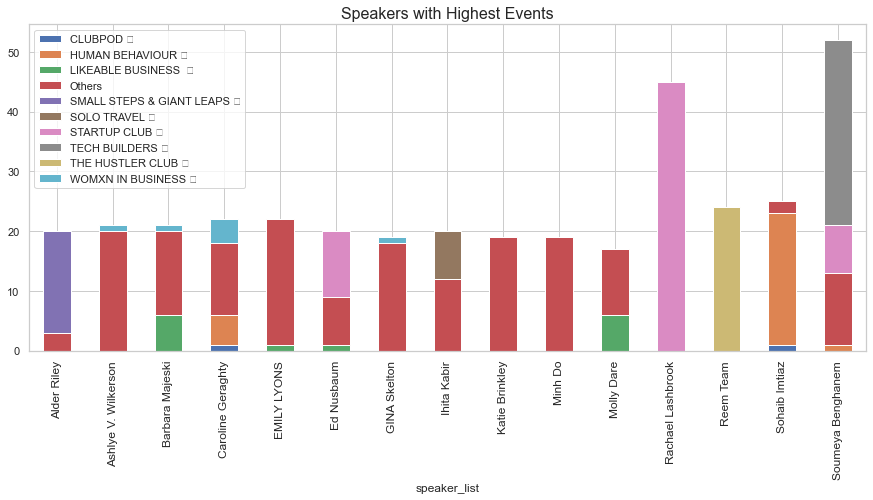

In [310]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from matplotlib.pyplot import figure

ax = df_speaker2.set_index('club_name').T.plot(kind='bar', stacked=True)
plt.rcParams["figure.figsize"] = (15,5)

plt.title("Speakers with Highest Events", fontsize=16)
plt.legend(loc='upper left')
plt.xticks(rotation=90,fontsize=12)
plt.show()

In [356]:
df_temp = pd.DataFrame(df_speaker[df_speaker['speaker_list']=="Soumeya Benghanem"][['speaker_list','room_name']])
df_temp['text'] = df_clean['room_name']
df_temp['text'] = df_temp['text'].fillna('')
df_temp['text'] = df_temp['text'].str.lower()
df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))

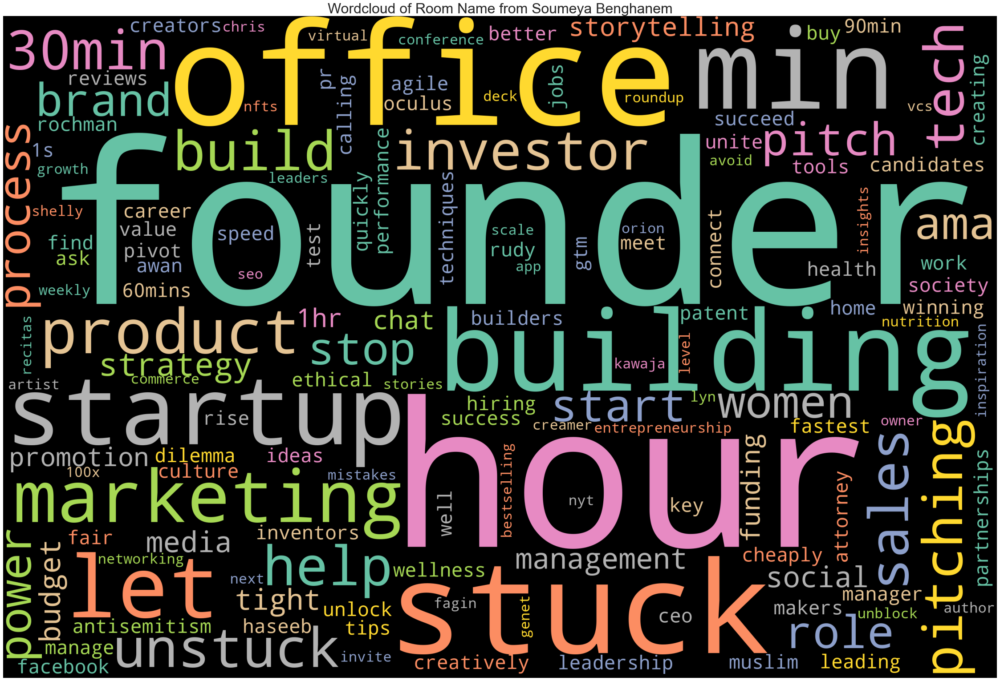

In [357]:
# Generate wordcloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = excl_words).generate(' '.join(df_temp['text']))
# Plot
plt.figure(figsize=(40, 30))
# Display image
plt.imshow(wordcloud) 
plt.title("Wordcloud of Room Name from Soumeya Benghanem", fontsize=32)
# No axis details
plt.axis("off");

In [358]:
df_temp = pd.DataFrame(df_speaker[df_speaker['speaker_list']=="Rachael Lashbrook"][['speaker_list','room_name']])
df_temp['text'] = df_clean['room_name']
df_temp['text'] = df_temp['text'].fillna('')
df_temp['text'] = df_temp['text'].str.lower()
df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))

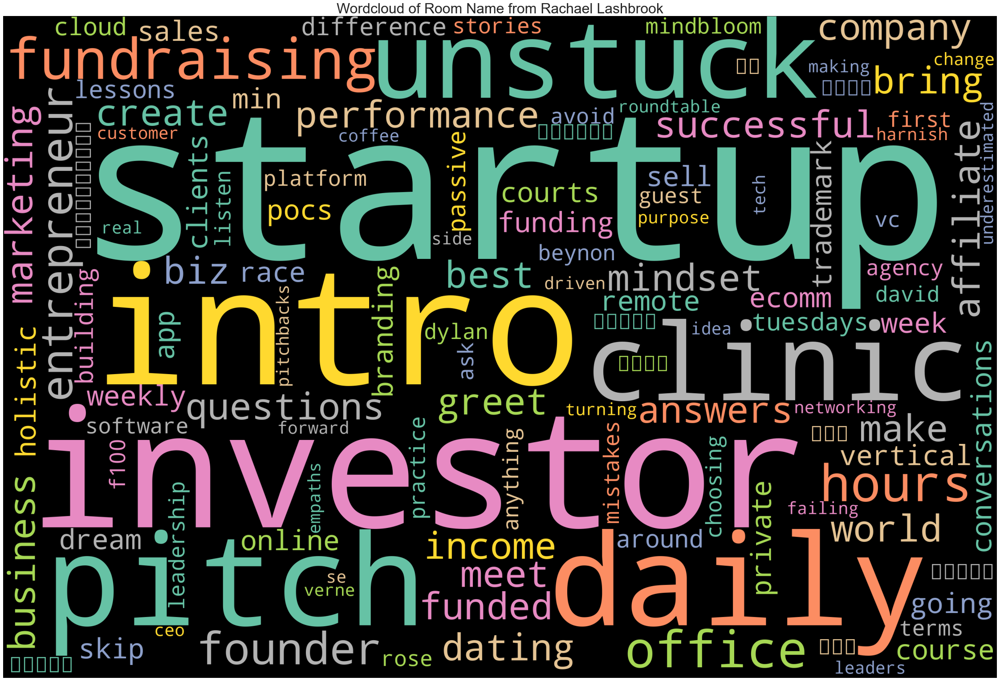

In [359]:
# Generate wordcloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = excl_words).generate(' '.join(df_temp['text']))
# Plot
plt.figure(figsize=(40, 30))
# Display image
plt.imshow(wordcloud) 
plt.title("Wordcloud of Room Name from Rachael Lashbrook", fontsize=32)
# No axis details
plt.axis("off");

In [312]:
df_time_club = pd.DataFrame(df_clean.groupby(['event_time_trunc_pst','club_name'])["room_name"].apply(';   '.join)).reset_index()
df_time_club["cnt_room"] = df_time_club["room_name"].str.count(";   ")+1

df_time_club["club_name"] = df_time_club.apply (lambda row: handle_longtail(row), axis=1)
df_time_club = df_time_club.pivot_table(index='club_name', columns='event_time_trunc_pst', values='cnt_room',aggfunc = "sum",).reset_index()
df_time_club

event_time_trunc_pst,club_name,00:00:00,01:00:00,02:00:00,03:00:00,04:00:00,05:00:00,06:00:00,07:00:00,08:00:00,...,14:00:00,15:00:00,16:00:00,17:00:00,18:00:00,19:00:00,20:00:00,21:00:00,22:00:00,23:00:00
0,BRAINCARE CLUB 🏠,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1,CLUBPOD 🏠,NaN,NaN,NaN,NaN,NaN,NaN,1.0,3.0,3.0,...,1.0,1.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,COMMUNITY CLUB 🏠,NaN,NaN,NaN,NaN,4.0,1.0,NaN,NaN,2.0,...,2.0,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3,FOUNDERSTREAMS 🏠,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,...,NaN,NaN,NaN,2.0,1.0,1.0,NaN,NaN,NaN,NaN
4,HUMAN BEHAVIOUR 🏠,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,1.0,...,NaN,NaN,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN
5,LIKEABLE BUSINESS 🏠,NaN,NaN,NaN,NaN,NaN,3.0,1.0,1.0,NaN,...,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
6,MEDSTARTR HEALTHCARE INNOVATORS 🏠,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,1.0,...,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Others,1.0,7.0,3.0,8.0,7.0,36.0,43.0,102.0,65.0,...,45.0,61.0,38.0,66.0,35.0,20.0,10.0,10.0,4.0,2.0
8,SMALL STEPS & GIANT LEAPS 🏠,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,1.0,NaN,1.0,5.0,NaN,1.0,NaN,NaN,NaN
9,SOLO TRAVEL 🏠,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN


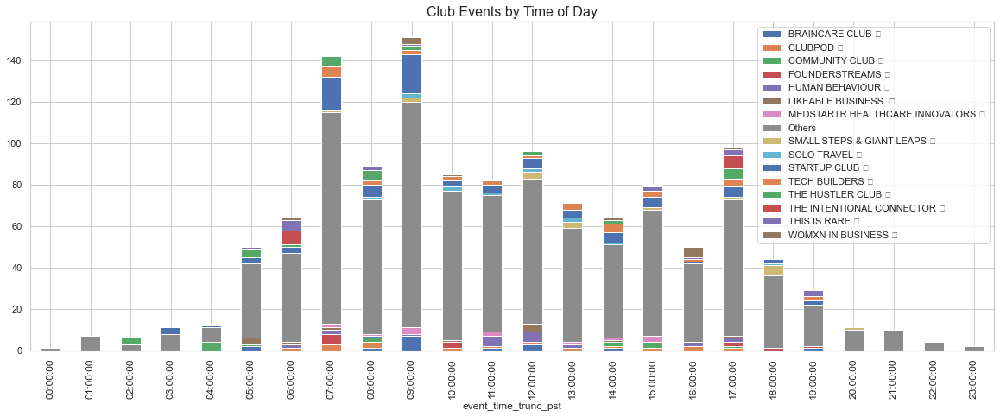

In [324]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from matplotlib.pyplot import figure

ax = df_time_club.set_index('club_name').T.plot(kind='bar', stacked=True)
plt.rcParams["figure.figsize"] = (20,7)

plt.title("Club Events by Time of Day", fontsize=16)
plt.legend(loc='upper right')
plt.xticks(rotation=90,fontsize=12)
plt.show()

# Topics

In [237]:
df_temp = pd.DataFrame()
df_temp['text'] = df_clean['room_desc2']
df_temp['text'] = df_temp['text'].fillna('')
df_temp['text'] = df_temp['text'].str.lower()
df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))

In [238]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [332]:
generic_words = ['come', 'join', 'share', 's', 'n', 'clubhouse', 'u', 'room', 'us', 'w', 'q','will','club']

excl_words = STOPWORDS.union(generic_words)

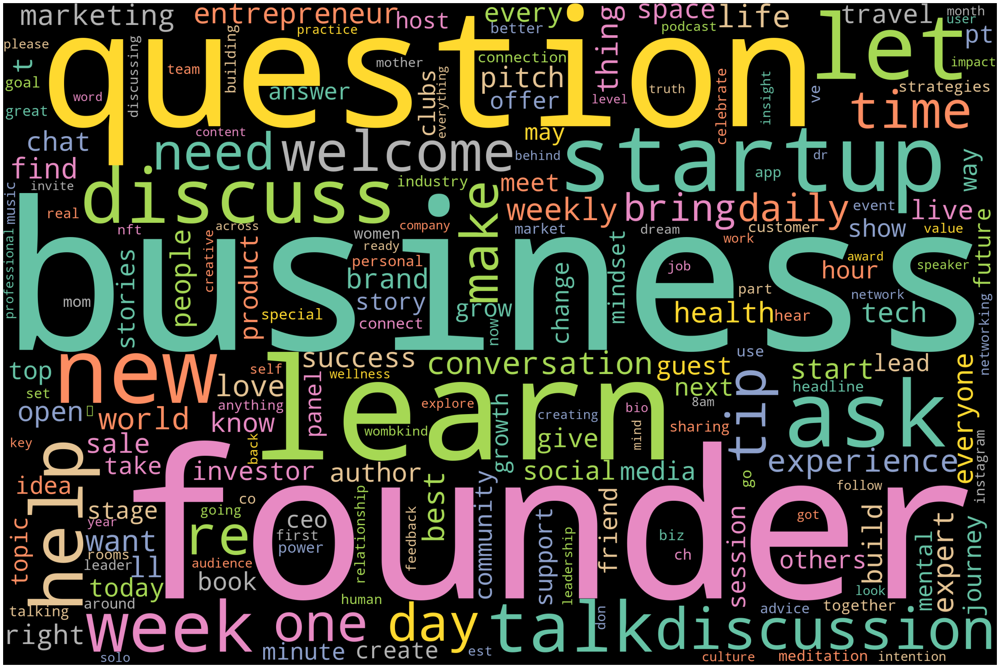

In [333]:
# Generate wordcloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = excl_words).generate(' '.join(df_temp['text']))
# Plot
plt.figure(figsize=(40, 30))
# Display image
plt.imshow(wordcloud) 
# plt.title("Wordcloud of Room Descriptions in Clubhouse", fontsize=32)
# No axis details
plt.axis("off");

In [241]:
import PIL.Image
from pylab import *

Image opened and saved!


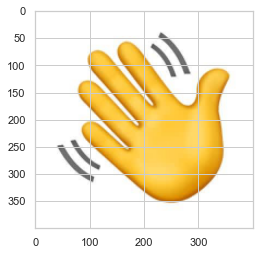

In [242]:
# open image (just make sure it's in your working directory) and save mask to book

mic = np.array(PIL.Image.open('Downloads/p7fjdpzeklmjzj1uxhaz.jpeg'))

imshow(mic)

print('Image opened and saved!')

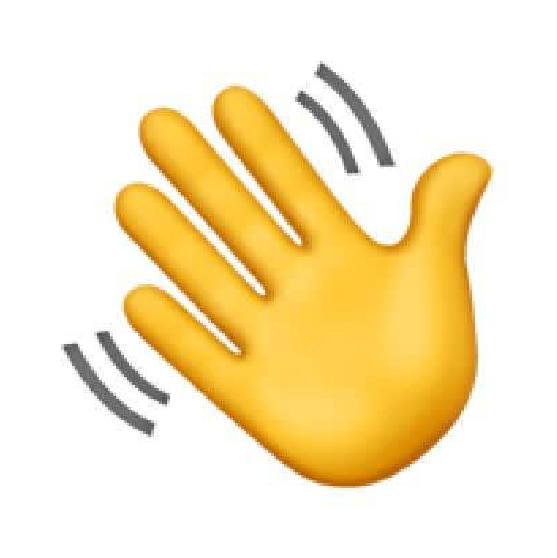

In [243]:
# display mask image

fig = plt.figure()
fig.set_figwidth(10) # set width
fig.set_figheight(10) # set height

plt.imshow(mic, cmap=plt.cm.gray, interpolation='None')
plt.axis('off')
plt.show()

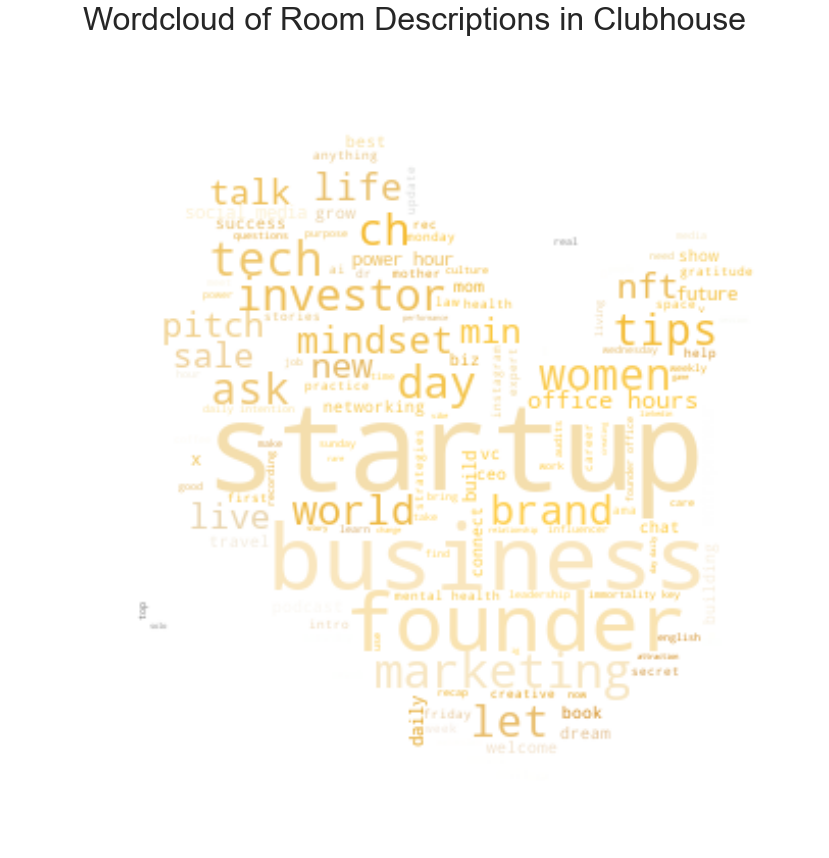

In [336]:
# create a beautiful wordcloud

stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=3000, mask=mic,
               stopwords=excl_words, max_font_size=60, random_state=42)
# generate word cloud
wc.generate(' '.join(df_temp['text']))

# create coloring from image
image_colors = ImageColorGenerator(mic)

# show
plt.figure(figsize=(15, 15))

# recolor wordcloud and show
# we could also give color_func=image_colors directly in the constructor
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.title("Wordcloud of Room Descriptions in Clubhouse", fontsize=32)
plt.axis('off')

plt.show()

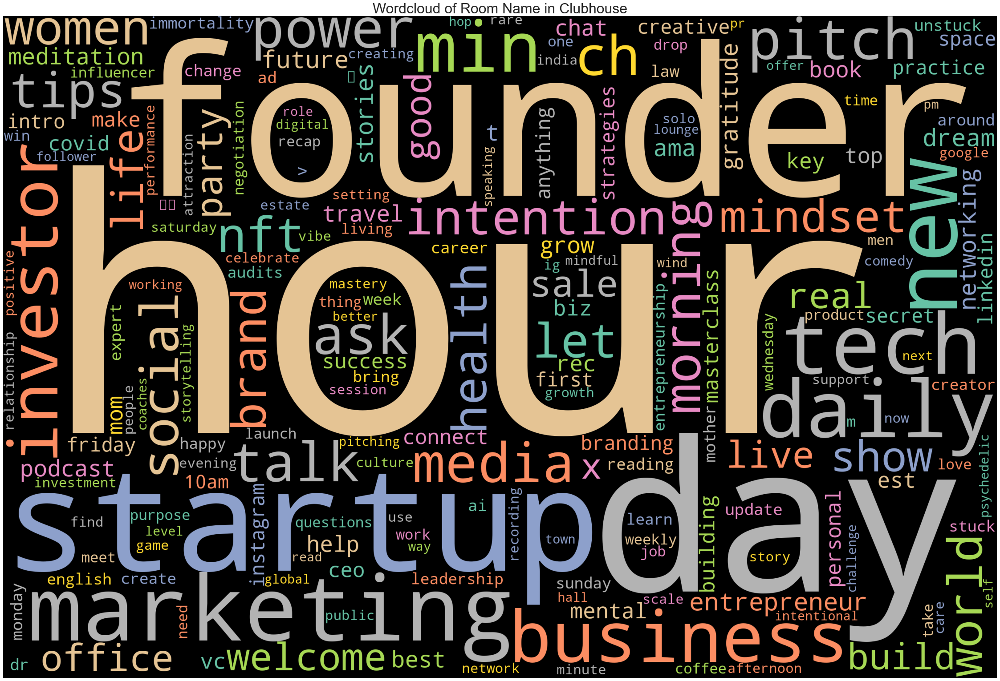

In [337]:
df_temp = pd.DataFrame(df_clean[['room_name','event_ts','speakers','room_desc2']])
df_temp['text'] = df_temp['room_name']
df_temp['text'] = df_temp['text'].fillna('')
df_temp['text'] = df_temp['text'].str.lower()
df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))

# Generate wordcloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = excl_words).generate(' '.join(df_temp['text']))
# Plot
plt.figure(figsize=(40, 30))
# Display image
plt.imshow(wordcloud)
plt.title("Wordcloud of Room Name in Clubhouse", fontsize=32)
# No axis details
plt.axis("off");

In [246]:
df_clean[df_clean['club_name']=='STARTUP CLUB 🏠'][['room_name','event_ts','speakers','room_desc2']]

,room_name,event_ts,speakers,room_desc2
37,How To Pitch VCs and Angel Investors 📈🔥💰,2021-05-08 15:05:00,"Sama Jashnani, David S. Rose, Marco Faccini, T...","Learn from an all-star panel on how to pitch, ..."
38,Skip Investor Funding by Going Vertical 🚀 (30 ...,2021-05-08 15:30:00,"Robin Copernicus, Rachael Lashbrook",Vertical startups such as Dollar Shave Club ha...
42,Intro to Startup Club 101 – Daily,2021-05-08 16:00:00,"Olivia Valdes, Colin Campbell, Rachael Lashbro...",Welcome to Startup Club Meet & Greet! One of t...
55,"🎪 Hiring Fair: Founders Pitch Roles, Candidate...",2021-05-08 17:00:00,"Soumeya Benghanem, Saba Karim, Ade Ade",Looking for talent to join your startup? Use t...
168,Intro to Startup Club – Daily,2021-05-09 16:00:00,"Olivia Valdes, Colin Campbell, Rachael Lashbro...",Welcome to Startup Club Meet & Greet! One of t...
...,...,...,...,...
1239,Intro to Startup Club 101 – Daily,2021-05-02 16:00:00,"Olivia Valdes, Colin Campbell, Rachael Lashbro...",Welcome to Startup Club Meet & Greet! One of t...
1279,#MiamiTech,2021-05-02 21:15:00,"Saif Ishoof, Melissa Medina, Delian, Brian Bre...",(Event info coming soon)
1292,Office Hours ⏰ for Underestimated Founders & I...,2021-05-03 00:00:00,"Chris Moreno, Max Tuchman, Brandon Brooks, Zéc...",Join founders & investors each week for office...
1318,Founders Get Unstuck 🇬🇧🚀🦄 StartUp Talent Q&A (...,2021-05-03 11:30:00,"Anton Kooll, Dr. Francine Hardaway, Elisa Nard...",🕧 HR | Talent Acquisition | Recruitment | 𝐇𝐢𝐫𝐢...


In [247]:
df_temp = pd.DataFrame(df_clean[df_clean['club_name']=='STARTUP CLUB 🏠'][['room_name','event_ts','speakers','room_desc2']])
df_temp['text'] = df_temp['room_desc2']
df_temp['text'] = df_temp['text'].fillna('')
df_temp['text'] = df_temp['text'].str.lower()
df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))

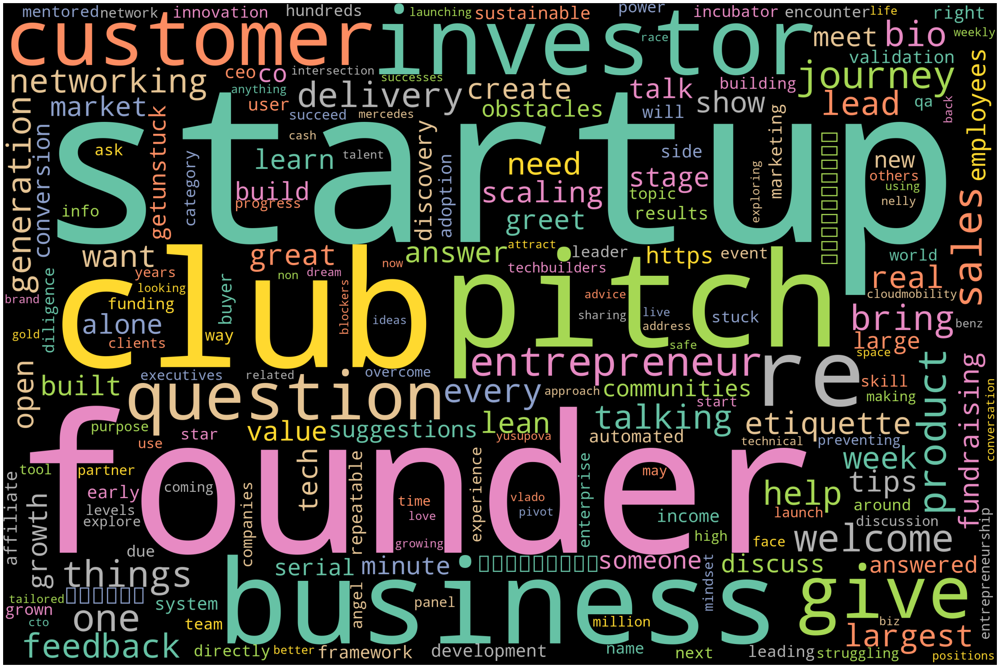

In [248]:
# Generate wordcloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = excl_words).generate(' '.join(df_temp['text']))
# Plot
plt.figure(figsize=(40, 30))
# Display image
plt.imshow(wordcloud) 
# No axis details
plt.axis("off");

In [249]:
def get_time_group (row):
    if row.event_ts.hour >= 4 and row.event_ts.hour < 6:
        return "dawn"
    elif row.event_ts.hour >= 6 and row.event_ts.hour < 12:
        return "morning"
    elif row.event_ts.hour >= 12 and row.event_ts.hour < 14:
        return "noon"
    elif row.event_ts.hour >= 14 and row.event_ts.hour < 17:
        return "afternoon"
    elif row.event_ts.hour >= 17 and row.event_ts.hour < 23:
        return "evening"
    else:
        return "midnight"

In [250]:
df_clean['time_of_day_group'] = df_clean.apply(lambda row: get_time_group(row), axis=1)
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2,speaker_list,event_ts_trunc_pst,event_time_trunc_pst,day_name,time_of_day_group
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,"[Semhar Negassa, Zipporah Kuria, Aidan Cleverl...",2021-05-08 04:00:00-07:00,04:00:00,Saturday,morning
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00,"Taimak Glowz, Ju Beck, Annemarie Schmidt, Farn...",NaN,"[Taimak Glowz, Ju Beck, Annemarie Schmidt, Far...",2021-05-08 04:00:00-07:00,04:00:00,Saturday,morning
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"Gary Henderson, Peyton Henderson",Saturday’s are for the side hustle.,"[Gary Henderson, Peyton Henderson]",2021-05-08 05:00:00-07:00,05:00:00,Saturday,morning
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi, ...",✅ اتاق تحلیل کریپتوکارنسی از صفر تا صد📈💵,"[faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi,...",2021-05-08 05:00:00-07:00,05:00:00,Saturday,morning
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00,"Kal Patel, Lali Dangazele, Matt Sakumoto, Domi...",NaN,"[Kal Patel, Lali Dangazele, Matt Sakumoto, Dom...",2021-05-08 05:00:00-07:00,05:00:00,Saturday,noon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Caroline Geraghty, Hala Taha, Steve Olsher, Ka...","Join Hala, celebrity podcasters & top influenc...","[Caroline Geraghty, Hala Taha, Steve Olsher, K...",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Victoria Elena Nones, God, Rachel Weintraub, G...",Come to the talent show where talented people ...,"[Victoria Elena Nones, God, Rachel Weintraub, ...",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"John Assaraf, Julie Reisler, LISA♡ RUEFF, Bria...",🧠 Are you ready to achieve financial success f...,"[John Assaraf, Julie Reisler, LISA♡ RUEFF, Bri...",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Soumeya Benghanem, Justin Rogers",NaN,"[Soumeya Benghanem, Justin Rogers]",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight


In [251]:
df_clean['time_of_day_group'].unique()

array(['morning', 'noon', 'afternoon', 'evening', 'midnight', 'dawn'],
      dtype=object)

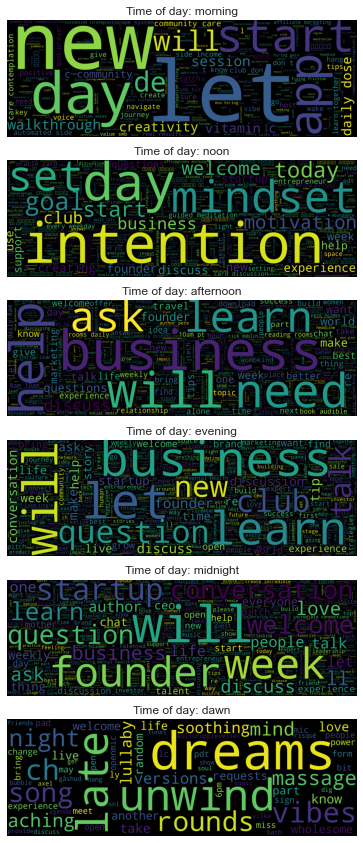

In [252]:
from wordcloud import WordCloud

fig = plt.figure(figsize = (20, 15))

a = 0

for a in range(len(df_clean.sort_values(by=['event_time'])['time_of_day_group'].unique())):
    
    c = df_clean['time_of_day_group'].unique()[a]
    
    ax = fig.add_subplot(6,1,a+1)
    ax.set_title('Time of day: %s'%c)
    
    
    df_temp = pd.DataFrame()
    df_temp['time_of_day_group'] = df_clean['time_of_day_group']
    df_temp['text'] = df_clean['room_desc2']
    df_temp['text'] = df_temp['text'].fillna('')
    df_temp['text'] = df_temp['text'].str.lower()
    df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))
    
    cluster = df_temp[df_temp.time_of_day_group == c]
    
    wordcloud = WordCloud(width = 3000, height=1000, max_words=1000,margin=0,stopwords = excl_words).generate(' '.join(cluster['text']))
    ax.imshow(wordcloud)
    ax.axis("off")


In [253]:
def get_time_group_pst (row):
    if row.event_ts_trunc_pst.hour >= 4 and row.event_ts_trunc_pst.hour < 6:
        return "dawn"
    elif row.event_ts_trunc_pst.hour >= 6 and row.event_ts_trunc_pst.hour < 12:
        return "morning"
    elif row.event_ts_trunc_pst.hour >= 12 and row.event_ts_trunc_pst.hour < 14:
        return "noon"
    elif row.event_ts_trunc_pst.hour >= 14 and row.event_ts_trunc_pst.hour < 17:
        return "afternoon"
    elif row.event_ts_trunc_pst.hour >= 17 and row.event_ts_trunc_pst.hour < 23:
        return "evening"
    else:
        return "midnight"

In [254]:
df_clean['time_of_day_group_pst'] = df_clean.apply(lambda row: get_time_group_pst(row), axis=1)
df_clean

,room_name,event_date,event_time,room_desc,club_name,event_ts,event_ts_trunc,event_time_trunc,speakers,room_desc2,speaker_list,event_ts_trunc_pst,event_time_trunc_pst,day_name,time_of_day_group,time_of_day_group_pst
0,Welcome to Clubhouse 🎉 (Beginners Guide + Q&A),2021-05-08,11:10,"w/ Semhar Negassa, Zipporah Kuria, Aidan Cleve...",COMMUNITY CLUB 🏠,2021-05-08 11:10:00,2021-05-08 11:00:00,11:00:00,"Semhar Negassa, Zipporah Kuria, Aidan Cleverly...",New to Clubhouse? Not sure how to start a club...,"[Semhar Negassa, Zipporah Kuria, Aidan Cleverl...",2021-05-08 04:00:00-07:00,04:00:00,Saturday,morning,dawn
1,Weekend practice 🤯😊🇩🇪🥰,2021-05-08,11:15,"w/ Taimak Glowz, Ju Beck, Annemarie Schmidt, F...",PRACTICE GERMAN...SLOWLY 🏠,2021-05-08 11:15:00,2021-05-08 11:00:00,11:00:00,"Taimak Glowz, Ju Beck, Annemarie Schmidt, Farn...",NaN,"[Taimak Glowz, Ju Beck, Annemarie Schmidt, Far...",2021-05-08 04:00:00-07:00,04:00:00,Saturday,morning,dawn
2,Side Hustle Saturday - How To Make An Extra $1k,2021-05-08,11:30,"w/ Gary Henderson, Peyton Henderson — Saturday...",GARY 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"Gary Henderson, Peyton Henderson",Saturday’s are for the side hustle.,"[Gary Henderson, Peyton Henderson]",2021-05-08 05:00:00-07:00,05:00:00,Saturday,morning,dawn
3,✅ تحلیل کریپتوکارنسی از صفر تا صد📈💵,2021-05-08,11:30,"w/ faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rah...",VIP 🏠,2021-05-08 11:30:00,2021-05-08 12:00:00,12:00:00,"faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi, ...",✅ اتاق تحلیل کریپتوکارنسی از صفر تا صد📈💵,"[faryar, Ghazal Hj, Ehsan Hakimi, Mehran Rahi,...",2021-05-08 05:00:00-07:00,05:00:00,Saturday,morning,dawn
4,🎙📚5min BizBook share/react 🌎🌏🌍,2021-05-08,12:00,"w/ Kal Patel, Lali Dangazele, Matt Sakumoto, D...",MBA 🏠,2021-05-08 12:00:00,2021-05-08 12:00:00,12:00:00,"Kal Patel, Lali Dangazele, Matt Sakumoto, Domi...",NaN,"[Kal Patel, Lali Dangazele, Matt Sakumoto, Dom...",2021-05-08 05:00:00-07:00,05:00:00,Saturday,noon,dawn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1398,Crush Your Digital Brand: Social Media and Pod...,2021-05-04,00:00,"w/ Caroline Geraghty, Hala Taha, Steve Olsher,...",CLUBPOD 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Caroline Geraghty, Hala Taha, Steve Olsher, Ka...","Join Hala, celebrity podcasters & top influenc...","[Caroline Geraghty, Hala Taha, Steve Olsher, K...",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight,evening
1399,Talent Show,2021-05-04,00:00,"w/ Victoria Elena Nones, God, Rachel Weintraub...",TOO MANY MODS CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Victoria Elena Nones, God, Rachel Weintraub, G...",Come to the talent show where talented people ...,"[Victoria Elena Nones, God, Rachel Weintraub, ...",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight,evening
1401,🧠 WIN the Inner Game of Money 💰,2021-05-04,00:00,"w/ John Assaraf, Julie Reisler, LISA♡ RUEFF, B...",THE “INNER GAME” CLUB 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"John Assaraf, Julie Reisler, LISA♡ RUEFF, Bria...",🧠 Are you ready to achieve financial success f...,"[John Assaraf, Julie Reisler, LISA♡ RUEFF, Bri...",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight,evening
1408,How I Do It: Building,2021-05-04,00:00,"w/ Soumeya Benghanem, Justin Rogers",TECH BUILDERS 🏠,2021-05-04 00:00:00,2021-05-04 00:00:00,00:00:00,"Soumeya Benghanem, Justin Rogers",NaN,"[Soumeya Benghanem, Justin Rogers]",2021-05-03 17:00:00-07:00,17:00:00,Tuesday,midnight,evening


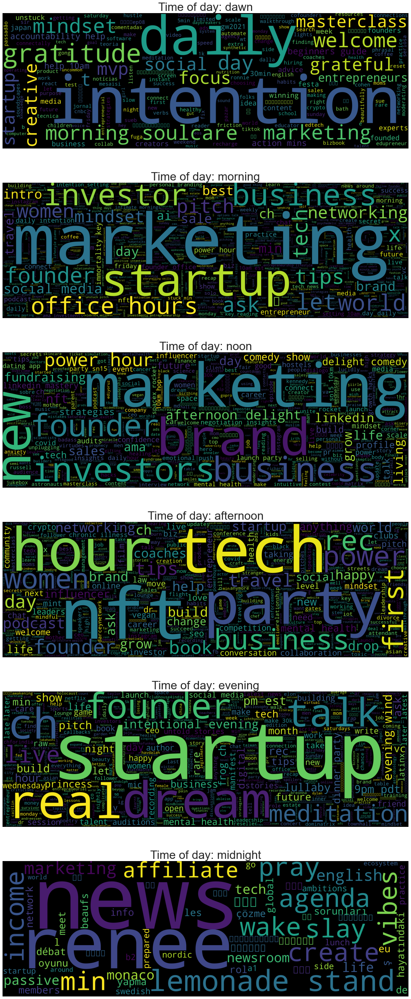

In [362]:
from wordcloud import WordCloud

fig = plt.figure(figsize = (20, 50))

a = 0

for a in range(len(df_clean['time_of_day_group_pst'].unique())):
    
    c = df_clean['time_of_day_group_pst'].unique()[a]
    
    ax = fig.add_subplot(6,1,a+1)
    ax.set_title('Time of day: %s'%c, fontsize=32)
    
    
    df_temp = pd.DataFrame()
    df_temp['time_of_day_group_pst'] = df_clean['time_of_day_group_pst']
    df_temp['text'] = df_clean['room_name']
    df_temp['text'] = df_temp['text'].fillna('')
    df_temp['text'] = df_temp['text'].str.lower()
    df_temp['text'] = df_temp['text'].apply(lambda x: ' '.join([word for word in x.split()]))
    
    cluster = df_temp[df_temp.time_of_day_group_pst == c]
    
    wordcloud = WordCloud(width = 3000, height=1000, max_words=1000,margin=0,stopwords = excl_words).generate(' '.join(cluster['text']))
    ax.imshow(wordcloud)
    ax.axis("off")

In [256]:
df_clean[df_clean['time_of_day_group_pst']=='midnight'].room_name.unique()

array(['⚪️🧿 𝟭𝟬𝟬 𝗜𝗰𝗵 𝗯𝗶𝗻 𝗦𝗼𝗽𝗵𝗶𝗲 𝗦𝗰𝗵𝗼𝗹𝗹 ⚪️🧿⚪️',
       'İş hayatındaki sorunları çözme/rol yapma oyunu',
       '🇪🇺 Meet and Network with Members of the EU Club 🇪🇺',
       '🎙 Les Beaufs de l’info 🎙 [ 12-12:30 ]',
       'No Agenda, Only Vibes...', 'i WAKE🚨i PRAY‼️i SLAY🗡(30) min',
       '💰💵 How to Create Passive Income - Affiliate Marketing 101',
       '🇫🇷 Global 🌏 NEWS❗️90’⏱ 3’🎙5’ débat🤚/ News',
       '🍏🍋The Lemonade Stand ™️ with Renee',
       '🎙☕️𝙋𝙤𝙙𝙘𝙖𝙨𝙩𝙞𝙣𝙜 𝙈𝙤𝙧𝙣𝙞𝙣𝙜 𝘾𝙝𝙖𝙩™️☕️🎙-𝙏𝙤 𝙋𝙞𝙣 𝙤𝙧 𝙉𝙤𝙩 𝙩𝙤 𝙋𝙞𝙣?', 'Go',
       'English practice #7 Ambitions (A1-B2)', 'Monaco Life News 🗞',
       '🍏🍋The Lemonade Stand™️ with Renee',
       'English Newsroom. 🗞Be prepared 💪🇺🇸🇬🇧🗣',
       '💰💵 How to Create Side Income - Affiliate Marketing 101',
       '🏴\u200d☠️🇸🇪🇫🇮🇩🇰🇳🇴Nordic Tech Lunch #75 Swedish startup ecosystem',
       '🌐Tech News around the World', '📆🌏🇬🇧🇺🇸English Newsroom ☕️',
       '🍏🍋 The Lemonade Stand ™️ with Renee'], dtype=object)

In [257]:
from gensim import utils
import gensim.parsing.preprocessing as gsp
# remove punctuation, short words, whitespaces, numeric
filters = [
           gsp.strip_punctuation,
           gsp.strip_multiple_whitespaces,
           gsp.strip_numeric,
           gsp.strip_short
          ]
def clean_text(s):
    s = s.lower()
    s = utils.to_unicode(s)
    for f in filters:
        s = f(s)
    return s
df2_clean = pd.DataFrame()
df2_clean['notes'] = df_clean['room_name'].astype(str).map(lambda x: clean_text(x))

In [258]:
from pprint import pprint

# Convert to list
data = df2_clean.notes.values.tolist()

# Remove Emails
data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]

# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]

pprint(data[:2])

['welcome clubhouse beginners guide', 'weekend practice 🤯😊🇩🇪🥰']


In [259]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:2])

[['welcome', 'clubhouse', 'beginners', 'guide'], ['weekend', 'practice']]


In [260]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['welcome', 'clubhouse', 'beginners', 'guide']


In [261]:
exclusions = []
exclusions.extend(generic_words)
exclusions.extend(STOPWORDS)


# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in exclusions] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [262]:
# spacy for lemmatization
import spacy

# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

[['welcome', 'beginner', 'guide']]


In [263]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1)]]


In [264]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('beginner', 1), ('guide', 1), ('welcome', 1)]]

In [265]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=7, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [266]:
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.057*"founder" + 0.030*"story" + 0.023*"investor" + 0.020*"make" + '
  '0.017*"life" + 0.014*"ask" + 0.014*"digital" + 0.014*"create" + '
  '0.014*"stem" + 0.014*"change"'),
 (1,
  '0.020*"take" + 0.019*"path" + 0.019*"pitch" + 0.016*"success" + '
  '0.016*"entrepreneur" + 0.016*"well" + 0.015*"party" + 0.014*"dream" + '
  '0.013*"ama" + 0.013*"coach"'),
 (2,
  '0.051*"tech" + 0.035*"min" + 0.025*"build" + 0.023*"talk" + 0.020*"news" + '
  '0.019*"business" + 0.016*"career" + 0.016*"friday" + 0.015*"welcome" + '
  '0.014*"stick"'),
 (3,
  '0.034*"marketing" + 0.029*"podcast" + 0.020*"mindset" + 0.017*"office_hour" '
  '+ 0.016*"use" + 0.015*"community" + 0.015*"speak" + 0.014*"min" + '
  '0.014*"public" + 0.013*"personal"'),
 (4,
  '0.035*"show" + 0.034*"brand" + 0.028*"nft" + 0.024*"tip" + 0.022*"future" + '
  '0.016*"help" + 0.014*"comedy" + 0.014*"talent" + 0.014*"afternoon_delight" '
  '+ 0.014*"intention"'),
 (5,
  '0.029*"startup" + 0.028*"club" + 0.024*"sale" + 0.017*"n

In [267]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -8.103897479384957

Coherence Score:  0.6708253295226976
